In [1]:
import keras
import tensorflow as tf
import gdal
import os
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
from keras_unet.models import custom_unet, satellite_unet
from keras_unet.metrics import iou, iou_thresholded
from keras_unet.losses import jaccard_distance
from keras_unet.utils import plot_segm_history

-----------------------------------------
keras-unet init: TF version is >= 2.0.0 - using `tf.keras` instead of `Keras`
-----------------------------------------


In [2]:
base_dir = Path(r'/media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_71v2')
mask_dir = base_dir.joinpath('masks_img')
image_dir = base_dir.joinpath('img')
water_dir = mask_dir.joinpath('water')
shrubs_dir = mask_dir.joinpath('shrub')
taiga_dir = mask_dir.joinpath('taiga')

In [3]:
def make_path(img_dir, prefix, number):
    return os.path.join(img_dir, f"{prefix}_{number}.tif")

In [4]:
def make_path_tile(img_dir, prefix, number):
    return os.path.join(img_dir, f"{prefix}{number}.tif")

In [5]:
def img_number(fpath: str) -> int:
    return int(os.path.splitext(os.path.split(fpath)[1])[0].split('_')[-1])

In [6]:
def load_image(path: str) -> np.ndarray:
    ds = gdal.Open(path, gdal.GA_ReadOnly)
    return ds.GetRasterBand(1).ReadAsArray()

In [7]:
def load_stack(shape, dtype, img_dir, prefix):
    stack = np.zeros(shape = shape, dtype = dtype)
    for i in range(shape[0]):
        image_path = make_path(img_dir, prefix, i + 1)
        stack[i, :, :] = load_image(image_path)
    return stack

def load_stack_safely(shape, dtype, img_dir, prefix):
    stack = np.zeros(shape = shape, dtype = dtype)
    for i in range(shape[0]):
        image_path = make_path(img_dir, prefix, i + 1)
        if not os.path.isfile(image_path):
            print("skipping", image_path)
            continue
        stack[i, :, :] = load_image(image_path)
    return stack

In [8]:
I = 245
N = 256
M = 256
V = 3

In [9]:
train_images = load_stack((I, N, M), np.float32, image_dir, "img")
train_images_R = train_images.reshape(I, N, M, 1)

In [10]:
train_images_R.shape

(245, 256, 256, 1)

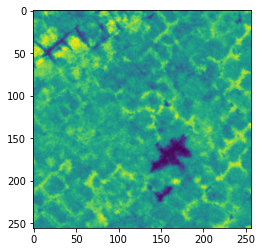

In [11]:
plt.imshow(train_images[1, :,:])

In [14]:
water_mask = load_stack_safely((I, N, M), np.int8, water_dir, "water")
taiga_mask = load_stack_safely((I, N, M), np.int8, taiga_dir, "taiga")
shrubs_mask = load_stack_safely((I, N, M), np.int8, shrubs_dir, "shrub")

skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_71v2/masks_img/water/water_4.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_71v2/masks_img/water/water_15.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_71v2/masks_img/water/water_19.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_71v2/masks_img/water/water_23.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_71v2/masks_img/water/water_24.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_71v2/masks_img/water/water_26.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_71v2/masks_img/water/water_30.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_71v2/masks_img/water/water_36.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_71v2/masks_img/water/water_37.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_71v2/

skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_71v2/masks_img/taiga/taiga_67.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_71v2/masks_img/taiga/taiga_68.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_71v2/masks_img/taiga/taiga_69.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_71v2/masks_img/taiga/taiga_71.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_71v2/masks_img/taiga/taiga_72.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_71v2/masks_img/taiga/taiga_73.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_71v2/masks_img/taiga/taiga_74.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_71v2/masks_img/taiga/taiga_75.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_71v2/masks_img/taiga/taiga_76.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_71v2

skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_71v2/masks_img/shrub/shrub_134.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_71v2/masks_img/shrub/shrub_135.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_71v2/masks_img/shrub/shrub_136.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_71v2/masks_img/shrub/shrub_137.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_71v2/masks_img/shrub/shrub_139.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_71v2/masks_img/shrub/shrub_142.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_71v2/masks_img/shrub/shrub_143.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_71v2/masks_img/shrub/shrub_144.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u_net_71v2/masks_img/shrub/shrub_149.tif
skipping /media/hkropp/research/Kolyma_Data/training/Kolyma/v2/u

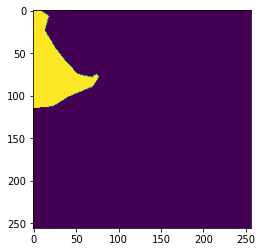

In [17]:
plt.imshow(taiga_mask[228, :,:])

In [20]:
taiga_mask[228,:,:]

array([[1, 1, 1, ..., 0, 0, 0],
       [1, 1, 1, ..., 0, 0, 0],
       [1, 1, 1, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int8)

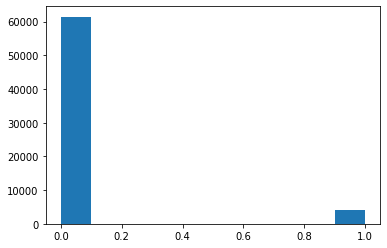

In [21]:
plt.hist(taiga_mask[228, :,:].flatten())
plt.show()

In [22]:
# divide data
W = 220
Y = np.zeros(shape=(W, N, M, V), dtype =np.int8)
Y_train_img = np.zeros(shape=(W, N, M, 1), dtype =np.float32)

Y[0:175, :, :, 0] = taiga_mask[0:175, :, :]
Y[0:175, :, :, 1] = water_mask[0:175, :, :]
Y[0:175, :, :, 2] = shrubs_mask[0:175, :, :]
Y_train_img[0:175, :, :, 0] = train_images_R[0:175, :, :, 0]

Y[175:220, :, :, 0] = taiga_mask[200:245, :, :]
Y[175:220, :, :, 1] = water_mask[200:245, :, :]
Y[175:220, :, :, 2] = shrubs_mask[200:245, :, :]
Y_train_img[175:225, :, :, 0] = train_images_R[200:245, :, :, 0]


K = 25
Y_valid = np.zeros(shape=(K, N, M, V), dtype =np.int8)
Y_valid_img = np.zeros(shape=(K, N, M, 1), dtype =np.float32)

Y_valid[0:25, :, :, 0] = taiga_mask[175:200, :, :]
Y_valid[0:25, :, :, 1] = water_mask[175:200, :, :]
Y_valid[0:25, :, :, 2] = shrubs_mask[175:200, :, :]
Y_valid_img[0:25, :, :, 0] = train_images_R[175:200, :, :, 0]




NameError: name 'trees_mask' is not defined

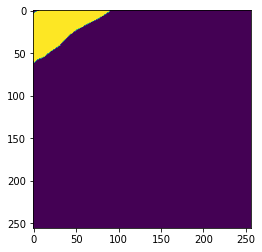

In [77]:
plt.imshow(Y[219,:,:,1])

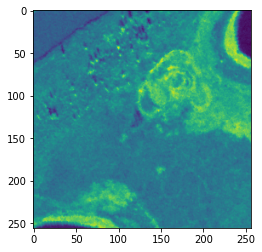

In [79]:
plt.imshow(Y_train_img[219,:,:,0])

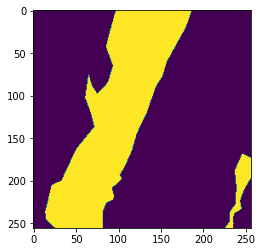

In [80]:
plt.imshow(Y_valid[24,:,:,1])

In [81]:
Y.shape

(220, 256, 256, 4)

In [87]:
model = satellite_unet((N, M, 1), V)

In [88]:
model.compile(
    optimizer = tf.keras.optimizers.Adam(),
    loss = "binary_crossentropy",
    metrics = [iou, iou_thresholded],
)

In [89]:
history = model.fit(Y_train_img, Y, epochs = 75)

Epoch 1/75
7/7 [==============================] - 61s 7s/step - loss: 0.5846 - iou: 0.1687 - iou_thresholded: 0.2569
Epoch 2/75
7/7 [==============================] - 51s 7s/step - loss: 0.2228 - iou: 0.3353 - iou_thresholded: 0.4721
Epoch 3/75
7/7 [==============================] - 50s 7s/step - loss: 0.1871 - iou: 0.4234 - iou_thresholded: 0.5092
Epoch 4/75
7/7 [==============================] - 51s 7s/step - loss: 0.1502 - iou: 0.4888 - iou_thresholded: 0.6256
Epoch 5/75
7/7 [==============================] - 50s 7s/step - loss: 0.1513 - iou: 0.5301 - iou_thresholded: 0.6249
Epoch 6/75
7/7 [==============================] - 51s 7s/step - loss: 0.1625 - iou: 0.4865 - iou_thresholded: 0.5573
Epoch 7/75
7/7 [==============================] - 50s 7s/step - loss: 0.1367 - iou: 0.5330 - iou_thresholded: 0.6378
Epoch 8/75
7/7 [==============================] - 49s 7s/step - loss: 0.1371 - iou: 0.5367 - iou_thresholded: 0.6344
Epoch 9/75
7/7 [==============================] - 48s 7s/step - 

7/7 [==============================] - 78s 11s/step - loss: 0.0714 - iou: 0.7230 - iou_thresholded: 0.8091
Epoch 71/75
7/7 [==============================] - 76s 11s/step - loss: 0.0721 - iou: 0.7296 - iou_thresholded: 0.8008
Epoch 72/75
7/7 [==============================] - 75s 11s/step - loss: 0.0614 - iou: 0.7532 - iou_thresholded: 0.8318
Epoch 73/75
7/7 [==============================] - 72s 10s/step - loss: 0.0640 - iou: 0.7393 - iou_thresholded: 0.8214
Epoch 74/75
7/7 [==============================] - 77s 11s/step - loss: 0.0572 - iou: 0.7683 - iou_thresholded: 0.8421
Epoch 75/75
7/7 [==============================] - 75s 11s/step - loss: 0.0557 - iou: 0.7773 - iou_thresholded: 0.8413


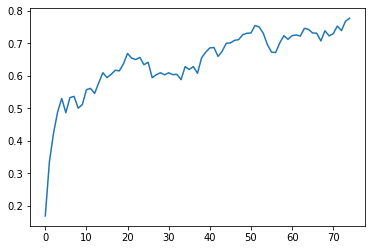

In [90]:
plt.plot(history.history['iou'])

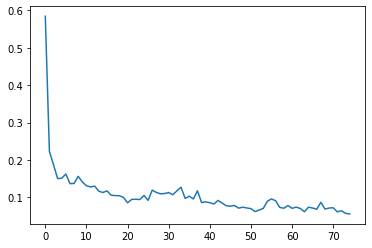

In [91]:
plt.plot(history.history['loss'])

In [97]:
modelsave_path = Path(r'/media/hkropp/research/Kolyma_Data/training/model/1971_strat')

In [98]:
model.save(modelsave_path)

INFO:tensorflow:Assets written to: /media/hkropp/research/Kolyma_Data/training/model/1971_strat/assets


INFO:tensorflow:Assets written to: /media/hkropp/research/Kolyma_Data/training/model/1971_strat/assets


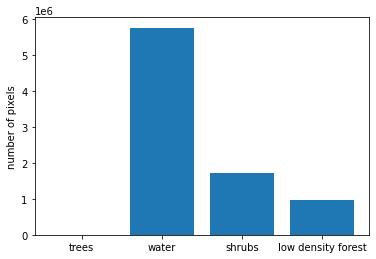

In [99]:
fig, ax = plt.subplots()
ax.bar(range(V), [trees_mask.sum(), water_mask.sum(), shrubs_mask.sum(), low_mask.sum()])
ax.set_xticks((0, 1, 2, 3))
ax.set_xticklabels(('trees', 'water', 'shrubs', 'low density forest'))
plt.ylabel('number of pixels')
plt.show()

In [92]:
Y_pred = model.predict(Y_train_img)

7/7 [==============================] - 24s 3s/step


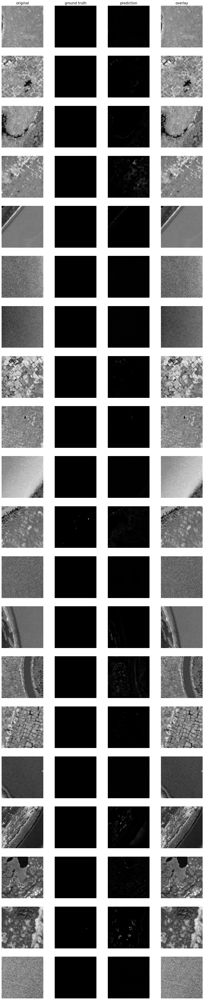

In [93]:
from keras_unet.utils import plot_imgs

# Trees
plot_imgs(
    org_imgs=Y_train_img, 
    mask_imgs=Y[:, :, :, 0], 
    pred_imgs=Y_pred[:, :, :, 0], 
    nm_img_to_plot=20
  )

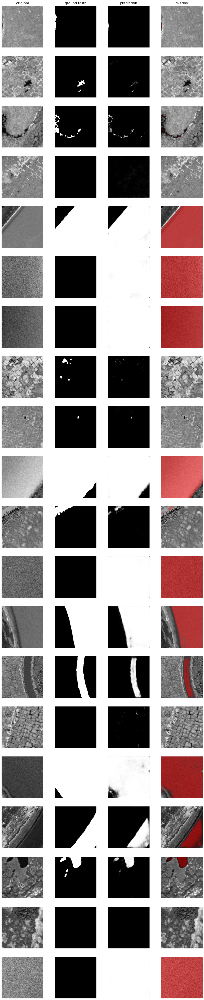

In [94]:
# Water
plot_imgs(
    org_imgs=Y_train_img, 
    mask_imgs=Y[:, :, :, 1], 
    pred_imgs=Y_pred[:, :, :, 1], 
    nm_img_to_plot=20
  )

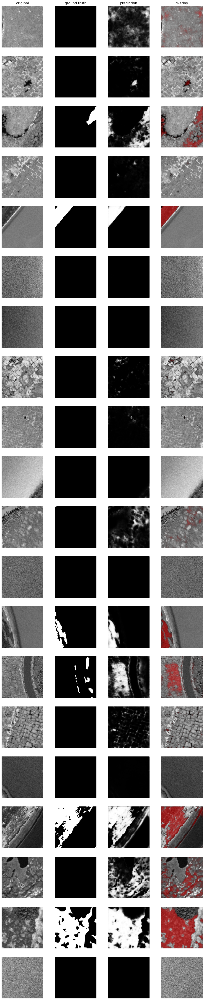

In [95]:
# Shrubs
plot_imgs(
    org_imgs=Y_train_img, 
    mask_imgs=Y[:, :, :, 2], 
    pred_imgs=Y_pred[:, :, :, 2], 
    nm_img_to_plot=20
  )

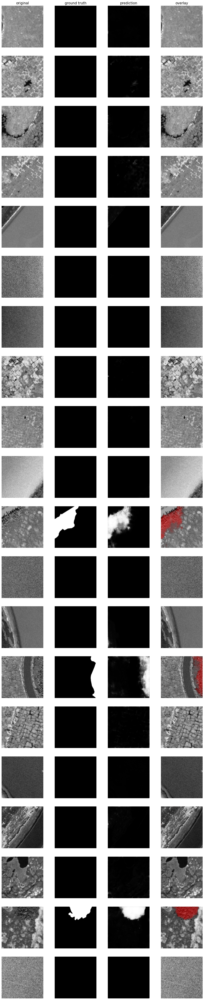

In [96]:
# Low density forest
plot_imgs(
    org_imgs=Y_train_img, 
    mask_imgs=Y[:, :, :, 3], 
    pred_imgs=Y_pred[:, :, :, 3], 
    nm_img_to_plot=20
  )

In [100]:
valid_pred = model.predict(Y_valid_img)

1/1 [==============================] - 3s 3s/step


In [101]:
valid_pred[1,:, :, 0]

array([[9.70990770e-03, 1.58741386e-04, 6.43023057e-04, ...,
        9.12359450e-04, 4.43943834e-04, 1.03778252e-02],
       [7.78193935e-04, 3.34691649e-05, 1.04641826e-04, ...,
        2.73321930e-04, 5.99994324e-04, 5.14975656e-03],
       [1.53177942e-04, 3.17375157e-06, 1.86755442e-05, ...,
        4.84107877e-05, 6.42149898e-05, 7.89605605e-04],
       ...,
       [6.16510748e-04, 4.77888352e-06, 1.28486799e-05, ...,
        2.08651903e-03, 7.69494521e-03, 3.10695879e-02],
       [6.45735417e-04, 4.10886787e-06, 3.27068665e-06, ...,
        7.87538383e-03, 3.26692127e-03, 4.59193205e-03],
       [2.41011078e-03, 2.98342202e-04, 2.97628376e-05, ...,
        2.14771945e-02, 3.07755824e-02, 3.44908126e-02]], dtype=float32)

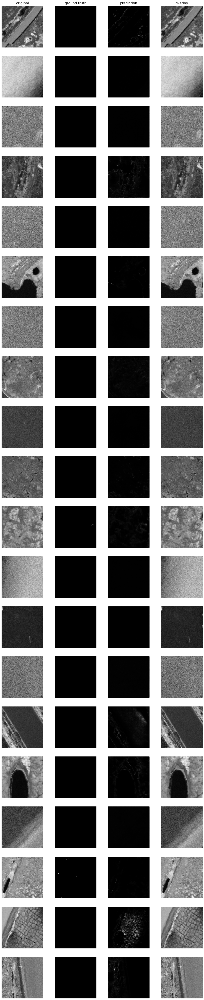

In [102]:
# Trees
plot_imgs(
    org_imgs=Y_valid_img, 
    mask_imgs=Y_valid[:, :, :, 0], 
    pred_imgs=valid_pred[:, :, :, 0], 
    nm_img_to_plot=20
  )

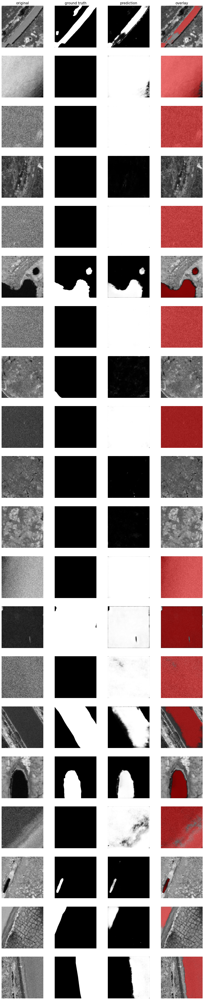

In [103]:
# Water
plot_imgs(
    org_imgs=Y_valid_img, 
    mask_imgs=Y_valid[:, :, :, 1], 
    pred_imgs=valid_pred[:, :, :, 1], 
    nm_img_to_plot=20
  )

In [104]:
waterPredict = valid_pred[:,:,:,1]

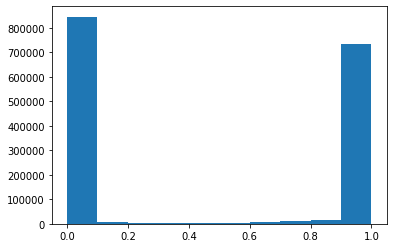

In [105]:
plt.hist(waterPredict.flatten())
plt.show()

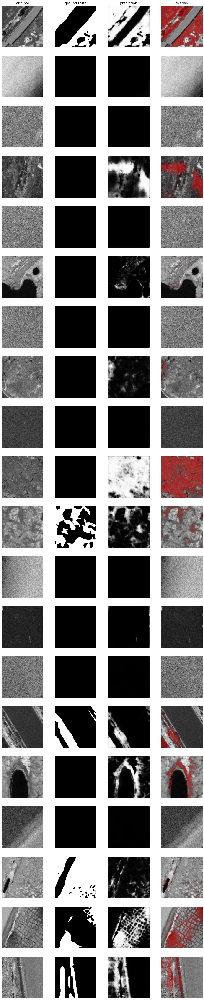

In [106]:
# Shrubs
plot_imgs(
    org_imgs=Y_valid_img, 
    mask_imgs=Y_valid[:, :, :, 2], 
    pred_imgs=valid_pred[:, :, :, 2], 
    nm_img_to_plot=20
  )

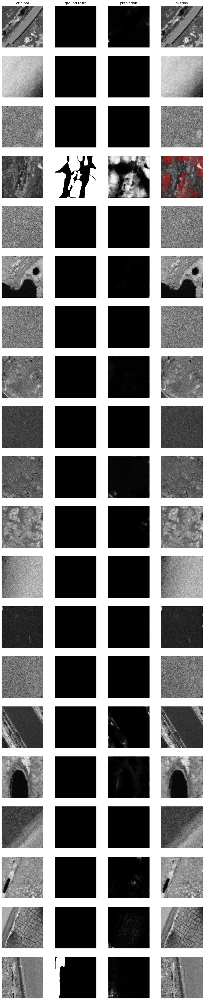

In [107]:
# Low density forest
plot_imgs(
    org_imgs=Y_valid_img, 
    mask_imgs=Y_valid[:, :, :, 3], 
    pred_imgs=valid_pred[:, :, :, 3], 
    nm_img_to_plot=20
  )

In [108]:
Y_valid[0,0,0,0]

0

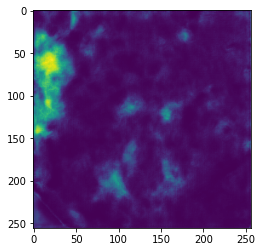

In [109]:
plt.imshow(valid_pred[7,:, :,2])

In [110]:
driver = gdal.GetDriverByName("GTiff")

In [111]:
driver.Register()

2

In [112]:
def save_predict_validT( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(0,25):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 176) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTree = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTree.SetGeoTransform(gt)
        outTree.SetProjection(pt)
        outBandTree = outTree.GetRasterBand(1)
        outBandTree.WriteArray(valid_pred[i,:,:,0])
        outBandTree.SetNoDataValue(np.nan)
        outBandTree.FlushCache()
        outBandTree = None
        outTree = None

In [113]:
tree_valid_dir = r'/media/hkropp/research/Kolyma_Data/training/eval/1971_strat/tree'
save_predict_validT(nImg = 25,xdim= 256, ydim= 256,img_dir = tree_valid_dir,prefix = "tree_predict",orig_dir = image_dir , prefix_orig = "img")

In [114]:
def save_predict_validW( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(0,25):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 176) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTree = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTree.SetGeoTransform(gt)
        outTree.SetProjection(pt)
        outBandTree = outTree.GetRasterBand(1)
        outBandTree.WriteArray(valid_pred[i,:,:,1])
        outBandTree.SetNoDataValue(np.nan)
        outBandTree.FlushCache()
        outBandTree = None
        outTree = None

In [115]:
water_valid_dir = r'/media/hkropp/research/Kolyma_Data/training/eval/1971_strat/water'
save_predict_validW(nImg = 25,xdim= 256, ydim= 256,img_dir = water_valid_dir,prefix = "water_predict",orig_dir = image_dir , prefix_orig = "img")

In [116]:
def save_predict_validS( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(0,25):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 176) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTree = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTree.SetGeoTransform(gt)
        outTree.SetProjection(pt)
        outBandTree = outTree.GetRasterBand(1)
        outBandTree.WriteArray(valid_pred[i,:,:,2])
        outBandTree.SetNoDataValue(np.nan)
        outBandTree.FlushCache()
        outBandTree = None
        outTree = None

In [117]:
shrub_valid_dir = r'/media/hkropp/research/Kolyma_Data/training/eval/1971_strat/shrub'
save_predict_validS(nImg = 25,xdim= 256, ydim= 256,img_dir = shrub_valid_dir,prefix = "shrub_predict",orig_dir = image_dir , prefix_orig = "img")

In [118]:
def save_predict_validL( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(0,25):
        image_path = make_path(img_dir, prefix, i + 1)
        orig_path = make_path(orig_dir, prefix_orig, i + 176) 
        orig_ds = gdal.Open(orig_path)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTree = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTree.SetGeoTransform(gt)
        outTree.SetProjection(pt)
        outBandTree = outTree.GetRasterBand(1)
        outBandTree.WriteArray(valid_pred[i,:,:,3])
        outBandTree.SetNoDataValue(np.nan)
        outBandTree.FlushCache()
        outBandTree = None
        outTree = None

In [119]:
lowD_valid_dir = r'/media/hkropp/research/Kolyma_Data/training/eval/1971_strat/low'
save_predict_validL(nImg = 25,xdim= 256, ydim= 256,img_dir = lowD_valid_dir,prefix = "lowD_predict",orig_dir = image_dir , prefix_orig = "img")

In [120]:
base_dirP = Path(r'/media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256')

In [121]:
tiles = os.listdir(base_dirP)

In [122]:
T = len(tiles)

In [123]:
# check for partial tiles
imgD1 = np.zeros((T,2), dtype=int)



test = load_image(r'/media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img1.tif')

In [124]:
for i in range(T):
    tileLoad = load_image(make_path_tile(base_dirP, "img", i + 1))
    imgD1[i,0] = tileLoad.shape[0]
    imgD1[i,1] = tileLoad.shape[1]

In [125]:
imgFlag = np.zeros((T), dtype=int)

for i in range(T):
    if imgD1[i,0] < 256 or imgD1[i,1] < 256:
        imgFlag[i] = 1
    else:
        imgFlag[i] = 0

In [126]:
imgTable = np.zeros((T,2), dtype=int)
for i in range(T):
    imgTable[i,0] = imgFlag[i]
    imgTable[i,1] = i+1

In [127]:
def load_stack_tiles(shape, dtype, img_dir, prefix, imgFlag):
    stack = np.zeros(shape = shape, dtype = dtype)
    for i in range(shape[0]):
        tilepath = make_path_tile(img_dir, prefix, i + 1)
        if imgFlag[i,0] == 1:
            print("nullified", tilepath)
            stack[i,:,:] = np.nan
        else:
            stack[i, :,:] = load_image(tilepath)
    return stack

In [128]:
predict_img = load_stack_tiles((T, N, M), np.float32,base_dirP, "img", imgTable)

nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img46.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img92.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img138.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img184.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img230.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img276.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img322.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img368.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img414.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img460.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img506.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256/img552.tif
nullified /media/hkropp/research/Kolyma_Da

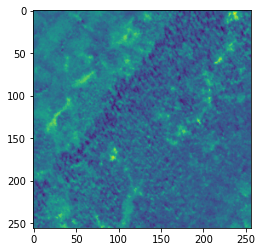

In [129]:
plt.imshow(predict_img[1000,:,:])

In [130]:
predict_img[3000,:,:]

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)

In [131]:
Y_all = model.predict(predict_img.reshape(T, N, M, 1))

95/95 [==============================] - 320s 3s/step


In [132]:
def save_predict_tree( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path_tile(orig_dir, prefix_orig, i + 1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all[i, :, :, 0])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [133]:
tree_valid_dir = r'/media/hkropp/research/Kolyma_Data/predictions/1971_strat/tree'
save_predict_tree(nImg = T,xdim= 256, ydim= 256,img_dir = tree_valid_dir,prefix = "tree_predict",orig_dir = base_dirP , prefix_orig = "img")

In [134]:
def save_predict_water( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path_tile(orig_dir, prefix_orig, i + 1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all[i, :, :, 1])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [135]:
water_valid_dir = r'/media/hkropp/research/Kolyma_Data/predictions/1971_strat/water'
save_predict_water(nImg = T,xdim= 256, ydim= 256,img_dir = water_valid_dir,prefix = "water_predict",orig_dir = base_dirP , prefix_orig = "img")

In [136]:
def save_predict_shrub( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path_tile(orig_dir, prefix_orig, i + 1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all[i, :, :, 2])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [137]:
shrub_valid_dir = r'/media/hkropp/research/Kolyma_Data/predictions/1971_strat/shrub'
save_predict_shrub(nImg = T,xdim= 256, ydim= 256,img_dir = shrub_valid_dir,prefix = "shrub_predict",orig_dir = base_dirP , prefix_orig = "img")

In [138]:
def save_predict_lowD( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path_tile(orig_dir, prefix_orig, i + 1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all[i, :, :, 3])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [139]:
lowD_valid_dir = r'/media/hkropp/research/Kolyma_Data/predictions/1971_strat/low'
save_predict_lowD(nImg = T,xdim= 256, ydim= 256,img_dir = lowD_valid_dir,prefix = "lowD_predict",orig_dir = base_dirP , prefix_orig = "img")

In [140]:
base_dirP2 = Path(r'/media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2')

tiles = os.listdir(base_dirP2)

T = len(tiles)

# check for partial tiles
imgD1 = np.zeros((T,2), dtype=int)



test = load_image(r'/media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img1.tif')

for i in range(T):
    tileLoad = load_image(make_path_tile(base_dirP2, "img", i + 1))
    imgD1[i,0] = tileLoad.shape[0]
    imgD1[i,1] = tileLoad.shape[1]

imgFlag = np.zeros((T), dtype=int)

for i in range(T):
    if imgD1[i,0] < 256 or imgD1[i,1] < 256:
        imgFlag[i] = 1
    else:
        imgFlag[i] = 0

imgTable = np.zeros((T,2), dtype=int)
for i in range(T):
    imgTable[i,0] = imgFlag[i]
    imgTable[i,1] = i+1

def load_stack_tiles(shape, dtype, img_dir, prefix, imgFlag):
    stack = np.zeros(shape = shape, dtype = dtype)
    for i in range(shape[0]):
        tilepath = make_path_tile(img_dir, prefix, i + 1)
        if imgFlag[i,0] == 1:
            print("nullified", tilepath)
            stack[i,:,:] = np.nan
        else:
            stack[i, :,:] = load_image(tilepath)
    return stack

In [141]:
predict_img_2 = load_stack_tiles((T, N, M), np.float32,base_dirP2, "img", imgTable)

nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img46.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img92.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img138.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img184.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img230.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img276.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img322.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img368.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img414.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img460.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img506.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_2/img552.tif
nullified /media/h

In [142]:
Y_all2 = model.predict(predict_img_2.reshape(T, N, M, 1))

95/95 [==============================] - 322s 3s/step


In [143]:
def save_predict_tree2( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path_tile(orig_dir, prefix_orig, i + 1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all2[i, :, :, 0])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [144]:
tree_valid_dir = r'/media/hkropp/research/Kolyma_Data/predictions/1971_strat_2/tree'
save_predict_tree2(nImg = T,xdim= 256, ydim= 256,img_dir = tree_valid_dir,prefix = "tree_predict",orig_dir = base_dirP2 , prefix_orig = "img")

In [145]:
def save_predict_water2( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path_tile(orig_dir, prefix_orig, i + 1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all2[i, :, :, 1])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [146]:
water_valid_dir = r'/media/hkropp/research/Kolyma_Data/predictions/1971_strat_2/water'
save_predict_water2(nImg = T,xdim= 256, ydim= 256,img_dir = water_valid_dir,prefix = "water_predict",orig_dir = base_dirP2 , prefix_orig = "img")

In [147]:
def save_predict_shrub2( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path_tile(orig_dir, prefix_orig, i + 1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all2[i, :, :, 2])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [148]:
shrub_valid_dir = r'/media/hkropp/research/Kolyma_Data/predictions/1971_strat_2/shrub'
save_predict_shrub2(nImg = T,xdim= 256, ydim= 256,img_dir = shrub_valid_dir,prefix = "shrub_predict",orig_dir = base_dirP2 , prefix_orig = "img")

In [149]:
def save_predict_lowD2( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path_tile(orig_dir, prefix_orig, i + 1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all2[i, :, :, 3])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [150]:
lowD_valid_dir = r'/media/hkropp/research/Kolyma_Data/predictions/1971_strat_2/low'
save_predict_lowD2(nImg = T,xdim= 256, ydim= 256,img_dir = lowD_valid_dir,prefix = "lowD_predict",orig_dir = base_dirP2 , prefix_orig = "img")

In [151]:
base_dirP3 = Path(r'/media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_3')

tiles = os.listdir(base_dirP3)

T = len(tiles)

# check for partial tiles
imgD1 = np.zeros((T,2), dtype=int)



test = load_image(r'/media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_3/img1.tif')

for i in range(T):
    tileLoad = load_image(make_path_tile(base_dirP3, "img", i + 1))
    imgD1[i,0] = tileLoad.shape[0]
    imgD1[i,1] = tileLoad.shape[1]

imgFlag = np.zeros((T), dtype=int)

for i in range(T):
    if imgD1[i,0] < 256 or imgD1[i,1] < 256:
        imgFlag[i] = 1
    else:
        imgFlag[i] = 0

imgTable = np.zeros((T,2), dtype=int)
for i in range(T):
    imgTable[i,0] = imgFlag[i]
    imgTable[i,1] = i+1

def load_stack_tiles(shape, dtype, img_dir, prefix, imgFlag):
    stack = np.zeros(shape = shape, dtype = dtype)
    for i in range(shape[0]):
        tilepath = make_path_tile(img_dir, prefix, i + 1)
        if imgFlag[i,0] == 1:
            print("nullified", tilepath)
            stack[i,:,:] = np.nan
        else:
            stack[i, :,:] = load_image(tilepath)
    return stack

In [152]:
predict_img_3 = load_stack_tiles((T, N, M), np.float32,base_dirP3, "img", imgTable)

nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_3/img46.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_3/img92.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_3/img138.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_3/img184.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_3/img230.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_3/img276.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_3/img322.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_3/img368.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_3/img414.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_3/img460.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_3/img506.tif
nullified /media/hkropp/research/Kolyma_Data/img_tiles/1971e/img_256_3/img552.tif
nullified /media/h

In [153]:
Y_all3 = model.predict(predict_img_3.reshape(T, N, M, 1))

95/95 [==============================] - 324s 3s/step


In [154]:
def save_predict_tree3( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path_tile(orig_dir, prefix_orig, i + 1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all3[i, :, :, 0])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [155]:
tree_valid_dir = r'/media/hkropp/research/Kolyma_Data/predictions/1971_strat_3/tree'
save_predict_tree3(nImg = T,xdim= 256, ydim= 256,img_dir = tree_valid_dir,prefix = "tree_predict",orig_dir = base_dirP3 , prefix_orig = "img")

In [156]:
def save_predict_water3( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path_tile(orig_dir, prefix_orig, i + 1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all3[i, :, :, 1])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [157]:
water_valid_dir = r'/media/hkropp/research/Kolyma_Data/predictions/1971_strat_3/water'
save_predict_water3(nImg = T,xdim= 256, ydim= 256,img_dir = water_valid_dir,prefix = "water_predict",orig_dir = base_dirP3 , prefix_orig = "img")

In [158]:
def save_predict_shrub3( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path_tile(orig_dir, prefix_orig, i + 1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all3[i, :, :, 2])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [159]:
shrub_valid_dir = r'/media/hkropp/research/Kolyma_Data/predictions/1971_strat_3/shrub'
save_predict_shrub3(nImg = T,xdim= 256, ydim= 256,img_dir = shrub_valid_dir,prefix = "shrub_predict",orig_dir = base_dirP3 , prefix_orig = "img")

In [160]:
def save_predict_lowD3( nImg, xdim,ydim, img_dir, prefix, orig_dir, prefix_orig):
    for i in range(T):
        image_path = make_path(img_dir, prefix, i + 1)
        tilepath = make_path_tile(orig_dir, prefix_orig, i + 1)
        orig_ds = gdal.Open(tilepath)
        gt = orig_ds.GetGeoTransform()
        pt = orig_ds.GetProjection()
        outTM = driver.Create(image_path, xsize=xdim, ysize=ydim,
                             bands=1, eType=gdal.GDT_Float32)
        outTM.SetGeoTransform(gt)
        outTM.SetProjection(pt)
        outBandTreeM = outTM.GetRasterBand(1)
        outBandTreeM.WriteArray(Y_all3[i, :, :, 3])
        outBandTreeM.SetNoDataValue(np.nan)
        outBandTreeM.FlushCache()
        outBandTreeM = None
        outTreeM = None

In [161]:
lowD_valid_dir = r'/media/hkropp/research/Kolyma_Data/predictions/1971_strat_3/low'
save_predict_lowD3(nImg = T,xdim= 256, ydim= 256,img_dir = lowD_valid_dir,prefix = "lowD_predict",orig_dir = base_dirP3 , prefix_orig = "img")